In [50]:
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns; sns.set_palette('colorblind'); sns.set_color_codes(); sns.set_style('white')
plt.style.use('classic')

import holoviews as hv
hv.notebook_extension('bokeh', 'matplotlib')
hv.plotting.mpl.MPLPlot.fig_alpha = 0   ## Bandaid: fix axisbg issue

import param
import paramnb

import numpy as np
import pandas as pd
from time import sleep

import scipy.stats as stats
print('holoviews %s'% hv.__version__)

holoviews 1.7.0


##### Reshaping arrays for speed

In [3]:
%%opts Path [width=500] (alpha=0.3 color='darkred')
%%opts Overlay [legend_position='top' ]
n_data  = 10
n_paths = 50
x_vals  = np.linspace(1,n_data,n_data)
values  = np.random.normal(size=(n_data,n_paths))
# Plot each path i with:  hv.Scatter( (x_vals, values(:,i)))

lbl     = 'Normally distributed random points'
h       = hv.Scatter((np.repeat(x_vals, n_paths), values.flatten()), label=lbl) * \
          hv.Path((x_vals, values))
h       = h.redim.range(x=(0,11), y=(-3,3))
h.relabel(label="Path has a constructor that Scatter doesn't")

:Overlay
   .Scatter.Normally_distributed_random_points :Scatter   [x]   (y)
   .Path.I                                     :Path   [x,y]

In [4]:
df=pd.DataFrame( dict(x1=[1,2,3,4],x2=[3,1,5,2], y1=[1,4,3,4],y2=[1,5,1,3]))
df

,x1,x2,y1,y2
0,1,3,1,1
1,2,1,4,5
2,3,5,3,1
3,4,2,4,3


In [5]:
%%opts Scatter (color='darkred')
# Plot Line Segments (x1,x2) -> (y1,y2); plot the points
def show_line_segments(df):
    baselines = [ np.array(a) for a in zip( df[['x1','x2']].as_matrix().tolist(),
                                            df[['y1','y2']].as_matrix().tolist() ) ]
    h = hv.Path( baselines )(style=dict(color='k', alpha=0.5))
    return h
# ----------------------------------------------------------
def show_points(df):
    return hv.Scatter((df.as_matrix().reshape(len(df)*2,2)))
# ----------------------------------------------------------
show_line_segments(df)*show_points(df).redim.range(x=(0,5),y=(0,6))

:Overlay
   .Path.I    :Path   [x,y]
   .Scatter.I :Scatter   [x]   (y)

##### Figure Size And Layout
Note Layouts are described in: http://holoviews.org/Tutorials/Containers.html

In [6]:
%%output backend='bokeh'
%%opts Curve [width=300 height=220]
data=np.linspace(-1.,1.,30)
h=hv.Curve((data, data**3),label="Cubic")+hv.Curve((data, data**5), label='Quintic')
h

:Layout
   .Curve.Cubic   :Curve   [x]   (y)
   .Curve.Quintic :Curve   [x]   (y)

In [7]:
%%opts Curve [width=200 height=150 yticks=2]
h=h+h
h.cols(2).relabel('Layout in 2 Columns')

:Layout
   .Curve.Cubic   :Curve   [x]   (y)
   .Curve.Quintic :Curve   [x]   (y)
   .Curve.I       :Curve   [x]   (y)
   .Curve.II      :Curve   [x]   (y)

Note: fig_size must be applied to Layout, not to Curve<br>
certain options which affect the whole figure have to be applied to the top-level container<br> (in this case a Layout) Result: as Curves get added, their size changes

:Layout
   .Curve.Cubic   :Curve   [x]   (y)
   .Curve.Quintic :Curve   [x]   (y)
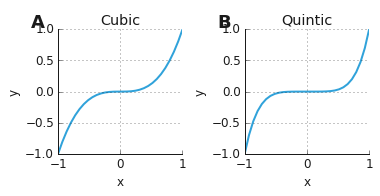

In [162]:
%%output backend='matplotlib'
%%opts Layout [fig_size=60]
%%opts Curve [aspect='equal' xticks=3] 
data=np.linspace(-1.,1.,30)
hv.Curve((data, data**3),label="Cubic") + hv.Curve((data, data**5),label='Quintic')

> Remove A,B (sublabel) with sublabel_format

:Layout
   .Curve.I  :Curve   [x]   (y)
   .Curve.II :Curve   [x]   (y)
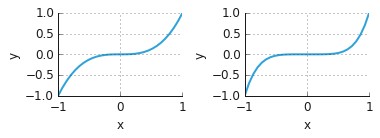

In [123]:
%%output backend='matplotlib'
%%opts Layout [fig_size=60 sublabel_format=None]
%%opts Curve [aspect=1.5 xticks=3] 
data=np.linspace(-1.,1.,30)
hv.Curve((data, data**3)) + hv.Curve((data, data**5))

##### Contours
* http://holoviews.org/Tutorials/Showcase.html   (contours, thresholds, ...)
* http://holoviews.org/Tutorials/Options.html    (options for images)

In [47]:
%%output backend='bokeh'
%%opts Image [colorbar=True](cmap='hot') Overlay[toolbar='above'] Polygons (cmap='hot' alpha=0.9)
# For the colorbar to make sense with filled contours,
#     set a colormap on both the image and the polygons
#     and put the bokeh toolbar on top
from holoviews.operation import contours as hv_contours

x,y = np.meshgrid(np.linspace(-5,5,101), np.linspace(5,-5,101))
z=np.exp(-.3*(x**2+y**2))
hv_contours(hv.Image(z), levels=[.2,.4,.6,.7,.85], filled=True)

:Overlay
   .Image.I :Image   [x,y]   (z)
   .Level.I :NdOverlay   [Levels]
      :Polygons   [x,y]   (z)

In [9]:
%%output backend='bokeh'
%%opts Overlay [shared_axes=False] Image [colorbar=False]
# the colorbar makes little sense with the fill option:
#     the colormaps are unrelated...
from holoviews.operation import contours as hv_contours

x,y = np.meshgrid(np.linspace(-5,5,101), np.linspace(5,-5,101))
z=np.sin(x**2+y**2)*np.exp(-0.3*x)
hv.Histogram(*np.histogram(z.flatten(), 30))+\
hv_contours(hv.Image(z), levels=[.2,.4,.6,.8], filled=True)

:Layout
   .Histogram.I :Histogram   [x]   (Frequency)
   .Overlay.I   :Overlay
      .Image.I :Image   [x,y]   (z)
      .Level.I :NdOverlay   [Levels]
         :Polygons   [x,y]   (z)

 %%opts Image  [colorbar=True] (cmap='coolwarm_r') Contours (color='r')
#could display the imagewith various colormaps, e.g. coolwarm, bone or gray

hv_contours(hv.Image(z), levels=[.2,.4,.6,.8]).hist()

##### HoloMaps and Dynamic Maps
Further information in Tutorials/Dynamic_Map.ipynb

In [10]:
def show_a_holomap():
    def ith():
        x_vals = np.linspace(0,1,10)
        h1 = hv.Curve( (x_vals,np.random.uniform(-2,2,size=10)))
        h2 = hv.Curve( (x_vals,np.random.uniform(-2,2,size=10)))
        # must wrap in an overlay before adding to a holomap
        return hv.Overlay([h1,h2])

    # precompute 5 sets of curves
    return hv.HoloMap({ i: ith() for i in range(5)})

show_a_holomap()

b':HoloMap   [Default]\n   :Overlay\n      .Curve.I  :Curve   [x]   (y)\n      .Curve.II :Curve   [x]   (y)'

In [11]:
%%output holomap='scrubber'
show_a_holomap()

b':HoloMap   [Default]\n   :Overlay\n      .Curve.I  :Curve   [x]   (y)\n      .Curve.II :Curve   [x]   (y)'

In [12]:
def show_a_dynamic_map():
    def ith(b):
        x_vals = np.linspace(0,1,10)
        h1 = hv.Curve( (x_vals,b+np.random.uniform(-2,2,size=10)))
        h2 = hv.Curve( (x_vals,b-np.random.uniform(-2,2,size=10)))(style=dict(color='turquoise'))
        # must wrap in an overlay before adding to a holomap
        return hv.Overlay([h1,h2])
    return hv.DynamicMap( ith, kdims=['b'])
dmap=show_a_dynamic_map()
(dmap[3].relabel(label='b=3')+dmap.select(b=5).relabel(label='b=5'))\
  .relabel(label='Compute 2 Dynamic Maps')

:Layout
   .Overlay.B_equals_3 :Overlay
      .Curve.I  :Curve   [x]   (y)
      .Curve.II :Curve   [x]   (y)
   .Overlay.B_equals_5 :Overlay
      .Curve.I  :Curve   [x]   (y)
      .Curve.II :Curve   [x]   (y)

b':DynamicMap   [b]\n   :Overlay\n      .Curve.I  :Curve   [x]   (y)\n      .Curve.II :Curve   [x]   (y)'
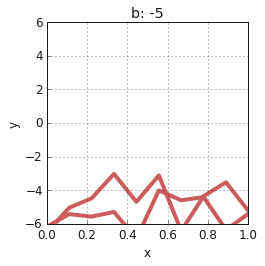

In [13]:
%%output backend="matplotlib"
%%opts Curve (color='indianred' linewidth=4)
#Note opts on Curve overrides the previously set style options
#Note: the data is cached: Once computed, no more randomness...
dmap=show_a_dynamic_map()
dmap.redim.range(b=(-5.,5.0), y=(-6,6))

In [14]:
%%output backend='bokeh'
%%opts Path [width=400 height=200 shared_axes=False xticks=17]
%%opts Histogram [invert_axes=True height=200 width=150  shared_axes=False xticks=3]

steps    = np.linspace(0.,15., 16)
rwalk      = np.random.uniform(-2, 2, size=(16, 1000))  # Sum{i,j, i=1:16}
rwalk[0,:] = 0.
rwalk    = np.cumsum(rwalk,axis=0)

hists = hv.HoloMap({ i: hv.Histogram( *np.histogram(rwalk[i], 20))(style=dict(fill_color='darkred', alpha=0.4))\
                    for i in range(1,16) }) #range(15,11,-1) })
paths = hv.Path((steps,rwalk), label='1000 Random Walks')(style=dict(alpha=0.02, color='darkred'))

paths << hists

b':AdjointLayout\n   :Path   [x,y]\n   :HoloMap   [Default]\n      :Histogram   [x]   (Frequency)'

##### GUIs

In [15]:
%%output backend="bokeh"
%%opts Curve [default_tools=[] tools=['hover']]
class RandomCurvesGUI(hv.streams.Stream):
    index      = param.Integer(default=10,  bounds=(0,10), precedence=-1.)
    amplitude  = param.Number (default=3.0, bounds=(0.,5.))
    dyn_update = param.Boolean(default=False)

    def __init__(self, **params):
        self.x_vals = np.linspace(0,10,10)
        self.update_data(**params)
        super(RandomCurvesGUI, self).__init__( **params )
        
    def update_data(self, **params):
        self.vals1 = np.random.uniform(-self.amplitude,self.amplitude,size=10)
        self.vals2 = np.random.uniform(-self.amplitude,self.amplitude,size=10)

    def get_view(self, **params):
        if self.index is 0 or self.dyn_update is False:
            self.update_data( **params )
        h = hv.Curve( (self.x_vals[0:self.index],self.vals1[0:self.index])) *\
            hv.Curve( (self.x_vals[0:self.index],self.vals2[0:self.index]))

        return h.redim.range( x=(0,10), y=(-8,8))

    def show(self):
        return hv.DynamicMap(hv.Callable(self.get_view, memoize=False), \
                             kdims=[], streams=[self])
%%opts Curve [width=650, height=300]{+framewise}

rc_gui = RandomCurvesGUI()

paramnb.Widgets( rc_gui, callback=rc_gui.event, button=False, next_n=1)  # Note next_n=1
rc_gui.show()

<IPython.core.display.Javascript object>

b':DynamicMap   []\n   :Overlay\n      .Curve.I  :Curve   [x]   (y)\n      .Curve.II :Curve   [x]   (y)'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
if rc_gui.dyn_update:
    rc_gui.event(index=0)
    for i in range(1,11):
        rc_gui.event(index=i)
        sleep(0.5)

##### Links
* http://holoviews.org/Tutorials/Elements.html
* http://holoviews.org/Tutorials/Options.html
* http://holoviews.org/Tutorials/Pandas_Seaborn.html